In [ ]:
### Instalamos todos las dependencias
! pip install kaggle
! pip install dython
! pip install category_encoders
! pip install lime
! pip install plotly
! pip install xgboost
! pip install lightgbm

In [ ]:
### configuramos para acceder los datos de kaggle y descargamos los datasets
import json
data = {"username":"danielyepesmesa","key":"84aa2288a3d961af65fb22e9ccda4433"}
with open('kaggle.json', 'w') as file:
    json.dump(data, file, indent=4)
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download -c playground-series-s4e8
! unzip playground-series-s4e8.zip

In [ ]:
### Importamos las librerias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder
from xgboost import XGBRegressor
import lightgbm as lgb
import gc
import seaborn as sns
import category_encoders as ce
import plotly.express as px
from dython.nominal import associations
from sklearn.impute import KNNImputer
import plotly.graph_objects as go
import lime
import lime.lime_tabular
from sklearn.metrics import matthews_corrcoef
from xgboost import XGBClassifier



In [ ]:
### Leemos los datasets utilizando pandas
df_sub=pd.read_csv("sample_submission.csv")
df_train=pd.read_csv("train.csv")
df_test=pd.read_csv("test.csv")

In [ ]:
### verificamos los datos en el dataset de entrenamiento
df_train.head()

,id,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,0,e,8.80,f,s,u,f,a,c,w,...,NaN,NaN,w,NaN,NaN,f,f,NaN,d,a
1,1,p,4.51,x,h,o,f,a,c,n,...,NaN,y,o,NaN,NaN,t,z,NaN,d,w
2,2,e,6.94,f,s,b,f,x,c,w,...,NaN,s,n,NaN,NaN,f,f,NaN,l,w
3,3,e,3.88,f,y,g,f,s,NaN,g,...,NaN,NaN,w,NaN,NaN,f,f,NaN,d,u
4,4,e,5.85,x,l,w,f,d,NaN,w,...,NaN,NaN,w,NaN,NaN,f,f,NaN,g,a


In [ ]:
### Verificamos los datos en el dataset de test
df_test.head()

,id,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,3116945,8.64,x,NaN,n,t,NaN,NaN,w,11.13,...,b,NaN,w,u,w,t,g,NaN,d,a
1,3116946,6.90,o,t,o,f,NaN,c,y,1.27,...,NaN,NaN,n,NaN,NaN,f,f,NaN,d,a
2,3116947,2.00,b,g,n,f,NaN,c,n,6.18,...,NaN,NaN,n,NaN,NaN,f,f,NaN,d,s
3,3116948,3.47,x,t,n,f,s,c,n,4.98,...,NaN,NaN,w,NaN,n,t,z,NaN,d,u
4,3116949,6.17,x,h,y,f,p,NaN,y,6.73,...,NaN,NaN,y,NaN,y,t,NaN,NaN,d,u


In [ ]:
### Verificamos las dimensiones de los dataset
df_test.shape,df_train.shape

((2077964, 21), (3116945, 22))

In [ ]:
### Eliminamos todas las columnas de ids
df_train = df_train.drop(columns=['id'])
df_test = df_test.drop(columns=['id'])

In [ ]:
### Verificamos el tipo de dato que tenemos en cada columna
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3116945 entries, 0 to 3116944
Data columns (total 21 columns):
 #   Column                Dtype  
---  ------                -----  
 0   class                 object 
 1   cap-diameter          float64
 2   cap-shape             object 
 3   cap-surface           object 
 4   cap-color             object 
 5   does-bruise-or-bleed  object 
 6   gill-attachment       object 
 7   gill-spacing          object 
 8   gill-color            object 
 9   stem-height           float64
 10  stem-width            float64
 11  stem-root             object 
 12  stem-surface          object 
 13  stem-color            object 
 14  veil-type             object 
 15  veil-color            object 
 16  has-ring              object 
 17  ring-type             object 
 18  spore-print-color     object 
 19  habitat               object 
 20  season                object 
dtypes: float64(3), object(18)
memory usage: 499.4+ MB


In [ ]:
### Categorisamos las columnas entre cualitativas y cuantitativas y sus valores unicos
categorical_columns = df_train.select_dtypes(include=['object']).columns
unique_values = {col: df_train[col].nunique() for col in categorical_columns}
for col, unique_count in unique_values.items():
    print(f"{col}: {unique_count} unique values")

gc.collect()

class: 2 unique values
cap-shape: 74 unique values
cap-surface: 83 unique values
cap-color: 78 unique values
does-bruise-or-bleed: 26 unique values
gill-attachment: 78 unique values
gill-spacing: 48 unique values
gill-color: 63 unique values
stem-root: 38 unique values
stem-surface: 60 unique values
stem-color: 59 unique values
veil-type: 22 unique values
veil-color: 24 unique values
has-ring: 23 unique values
ring-type: 40 unique values
spore-print-color: 32 unique values
habitat: 52 unique values
season: 4 unique values


0

In [ ]:
### Categorisamos las columnas entre cualitativas y cuantitativas y sus valores unicos
categorical_columns = df_test.select_dtypes(include=['object']).columns
unique_values = {col: df_test[col].nunique() for col in categorical_columns}
for col, unique_count in unique_values.items():
    print(f"{col}: {unique_count} unique values")

gc.collect()

cap-shape: 62 unique values
cap-surface: 59 unique values
cap-color: 57 unique values
does-bruise-or-bleed: 22 unique values
gill-attachment: 66 unique values
gill-spacing: 35 unique values
gill-color: 56 unique values
stem-root: 31 unique values
stem-surface: 54 unique values
stem-color: 55 unique values
veil-type: 15 unique values
veil-color: 23 unique values
has-ring: 23 unique values
ring-type: 36 unique values
spore-print-color: 33 unique values
habitat: 39 unique values
season: 4 unique values


60

In [ ]:
df_test.columns

Index(['cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring-type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')

In [ ]:
df_train.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring-type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')

In [ ]:
missing_train = df_train.isna().mean() * 100
missing_test = df_test.isna().mean() * 100

print("Columns in df_train with more than 10% missing values:")
print(missing_train[missing_train > 0])

print("\nColumns in df_test with more than 10% missing values:")
print(missing_test[missing_test > 0])

Columns in df_train with more than 10% missing values:
cap-diameter             0.000128
cap-shape                0.001283
cap-surface             21.528227
cap-color                0.000385
does-bruise-or-bleed     0.000257
gill-attachment         16.809280
gill-spacing            40.373988
gill-color               0.001829
stem-root               88.452732
stem-surface            63.551362
stem-color               0.001219
veil-type               94.884350
veil-color              87.936970
has-ring                 0.000770
ring-type                4.134818
spore-print-color       91.425482
habitat                  0.001444
dtype: float64

Columns in df_test with more than 10% missing values:
cap-diameter             0.000337
cap-shape                0.001492
cap-surface             21.506821
cap-color                0.000626
does-bruise-or-bleed     0.000481
gill-attachment         16.834796
gill-spacing            40.404694
gill-color               0.002358
stem-height              

<ipython-input-14-23f63c282bd7>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=missing_values.index, y=missing_values.values, palette='viridis')


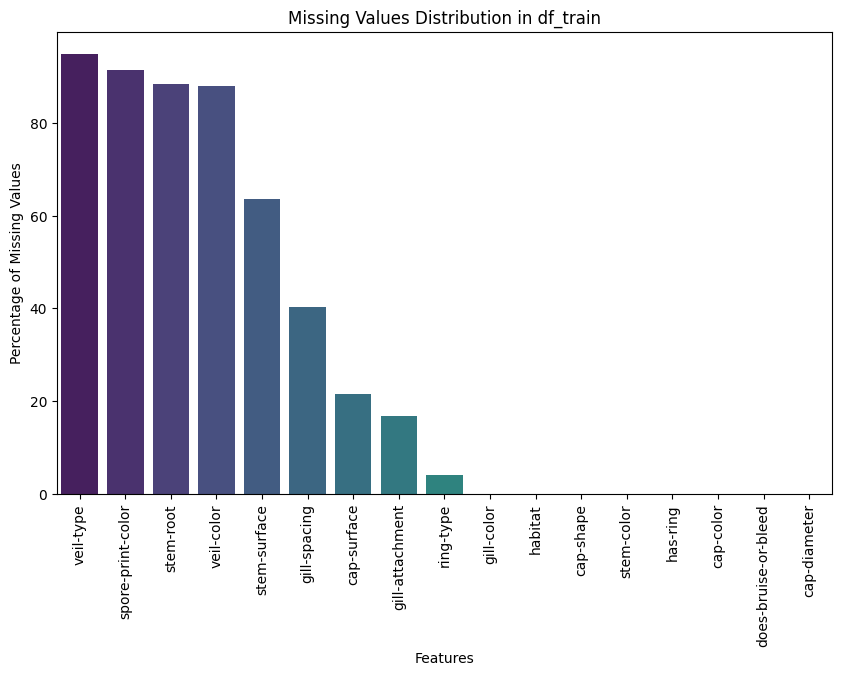

In [ ]:
missing_values = df_train.isnull().mean() * 100
missing_values = missing_values[missing_values >0]
missing_values = missing_values.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=missing_values.index, y=missing_values.values, palette='viridis')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Percentage of Missing Values')
plt.title('Missing Values Distribution in df_train')
plt.show()

In [ ]:
missing_threshold = 0.95

high_missing_columns = df_train.columns[df_train.isnull().mean() > missing_threshold]

df_train = df_train.drop(columns=high_missing_columns)
df_test = df_test.drop(columns=high_missing_columns)
target = 'class'

for column in df_train.columns:
    if df_train[column].isnull().any():
        if df_train[column].dtype == 'object':
            mode_value = df_train[column].mode()[0]
            df_train[column].fillna(mode_value, inplace=True)
            df_test[column].fillna(mode_value, inplace=True)
        else:
            median_value = df_train[column].median()
            df_train[column].fillna(median_value, inplace=True)
            df_test[column].fillna(median_value, inplace=True)

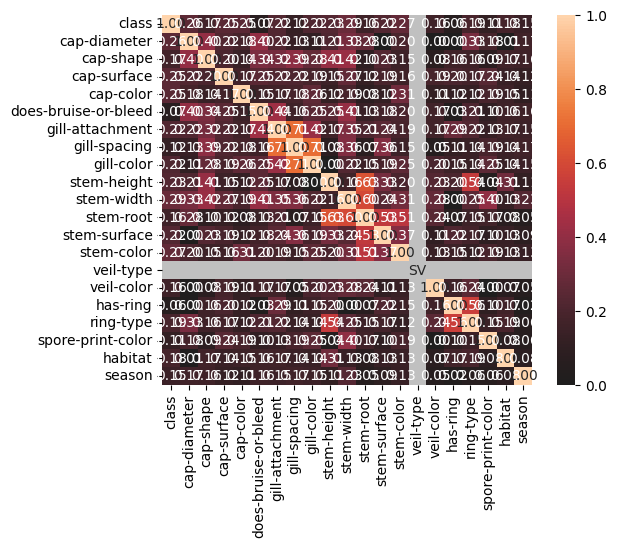

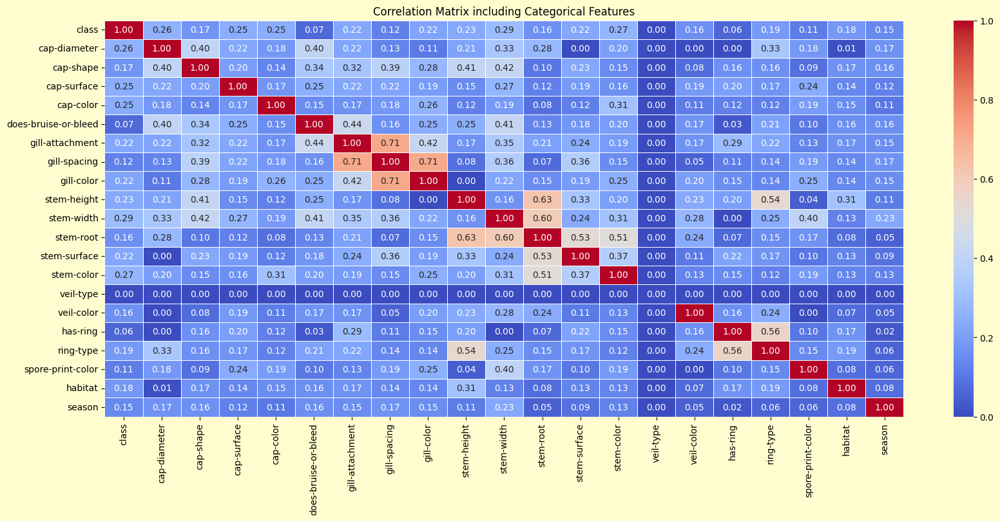

In [ ]:
associations_df = associations(df_train[:10000], nominal_columns='all', plot=False)
corr_matrix = associations_df['corr']
plt.figure(figsize=(20, 8))
plt.gcf().set_facecolor('#FFFDD0')
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix including Categorical Features')
plt.show()

In [ ]:
df_train1 = df_train[:10000].copy()

feature_counts = df_train1.groupby(['cap-shape', 'cap-color']).size().reset_index(name='count')
fig = px.sunburst(feature_counts, path=['cap-shape', 'cap-color'], values='count',
                 color='count', color_continuous_scale='Viridis',
                 title='Sunburst Chart of Cap Shape and Cap Color Distribution')

fig.update_layout(title_text='Sunburst Chart of Cap Shape and Cap Color Distribution',
                  title_x=0.5,width=900,height=600)
fig.show()

In [ ]:
flow_data = df_train1.groupby(['cap-shape', 'cap-color']).size().reset_index(name='count')
labels = list(pd.concat([flow_data['cap-shape'], flow_data['cap-color']]).unique())
label_map = {label: idx for idx, label in enumerate(labels)}

sources = flow_data['cap-shape'].map(label_map).tolist()
targets = flow_data['cap-color'].map(label_map).tolist()
values = flow_data['count'].tolist()


fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color='black', width=0.5),
        label=labels
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values
    )
)])

fig.update_layout(
    title_text='Sankey Chart of Cap Shape to Cap Color Flow',
    title_x=0.5,
    width=1000,
    height=600
)
fig.show()

In [ ]:
feature_counts = df_train1.groupby(['cap-shape', 'cap-color']).size().reset_index(name='count')
fig = px.bar(feature_counts, x='cap-shape', y='count', color='cap-color',
             title='Crosstab Chart of Cap Shape and Cap Color',
             labels={'cap-shape': 'Cap Shape', 'count': 'Count', 'cap-color': 'Cap Color'},
             color_discrete_sequence=px.colors.qualitative.Plotly,
             text='count')
fig.update_layout(
    title_text='Crosstab Chart of Cap Shape and Cap Color',
    title_x=0.5,
    xaxis_title='Cap Shape',
    yaxis_title='Count',
    barmode='stack'
)

fig.show()

In [ ]:
cols_to_drop_train = missing_train[missing_train > 95].index
cols_to_drop_test = missing_test[missing_test > 95].index

df_train = df_train.drop(columns=cols_to_drop_train)
df_test = df_test.drop(columns=cols_to_drop_test)
gc.collect()

974

In [ ]:
def knn_impute(df, n_neighbors=5):
    df_encoded = df.copy()
    for col in df_encoded.select_dtypes(include='object').columns:
        df_encoded[col] = df_encoded[col].astype('category').cat.codes
    knn_imputer = KNNImputer(n_neighbors=n_neighbors)
    df_imputed = pd.DataFrame(knn_imputer.fit_transform(df_encoded), columns=df_encoded.columns)
    for col in df.select_dtypes(include='object').columns:
        df_imputed[col] = df_imputed[col].round().astype(int).map(
            dict(enumerate(df[col].astype('category').cat.categories)))
    return df_imputed

In [ ]:
df_train_imputed = knn_impute(df_train, n_neighbors=5)
df_test_imputed = knn_impute(df_test, n_neighbors=5)

In [ ]:
cat_cols_train = df_train_imputed.select_dtypes(include=['object']).columns
cat_cols_train = cat_cols_train[cat_cols_train != 'class']
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

df_train_imputed[cat_cols_train] = ordinal_encoder.fit_transform(df_train_imputed[cat_cols_train].astype(str))
df_test_imputed[cat_cols_train] = ordinal_encoder.transform(df_test_imputed[cat_cols_train].astype(str))

In [ ]:
df_train_imputed.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,e,8.80,53.0,72.0,72.0,8.0,44.0,28.0,59.0,4.51,...,15.0,51.0,55.0,19.0,21.0,5.0,18.0,17.0,25.0,0.0
1,p,4.51,71.0,56.0,64.0,8.0,44.0,28.0,46.0,4.79,...,15.0,58.0,47.0,19.0,21.0,18.0,39.0,17.0,25.0,3.0
2,e,6.94,53.0,72.0,49.0,8.0,75.0,28.0,59.0,6.85,...,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,36.0,3.0
3,e,3.88,53.0,81.0,57.0,8.0,70.0,28.0,37.0,4.16,...,15.0,51.0,55.0,19.0,21.0,5.0,18.0,17.0,25.0,2.0
4,e,5.85,71.0,65.0,74.0,8.0,47.0,28.0,59.0,3.37,...,15.0,51.0,55.0,19.0,21.0,5.0,18.0,17.0,29.0,0.0


In [ ]:
df_test_imputed.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,8.64,71.0,76.0,63.0,20.0,44.0,28.0,59.0,11.13,17.12,15.0,51.0,55.0,19.0,21.0,18.0,19.0,17.0,25.0,0.0
1,6.90,63.0,76.0,64.0,8.0,44.0,28.0,61.0,1.27,10.75,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,0.0
2,2.00,48.0,55.0,63.0,8.0,44.0,28.0,46.0,6.18,3.14,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,1.0
3,3.47,71.0,76.0,63.0,8.0,70.0,28.0,46.0,4.98,8.51,15.0,51.0,55.0,19.0,14.0,18.0,39.0,17.0,25.0,2.0
4,6.17,71.0,56.0,76.0,8.0,66.0,28.0,61.0,6.73,13.70,15.0,51.0,57.0,19.0,22.0,18.0,18.0,17.0,25.0,2.0


In [ ]:
df_train = df_train_imputed
df_test = df_test_imputed

In [ ]:
df_test.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,8.64,71.0,76.0,63.0,20.0,44.0,28.0,59.0,11.13,17.12,15.0,51.0,55.0,19.0,21.0,18.0,19.0,17.0,25.0,0.0
1,6.90,63.0,76.0,64.0,8.0,44.0,28.0,61.0,1.27,10.75,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,0.0
2,2.00,48.0,55.0,63.0,8.0,44.0,28.0,46.0,6.18,3.14,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,1.0
3,3.47,71.0,76.0,63.0,8.0,70.0,28.0,46.0,4.98,8.51,15.0,51.0,55.0,19.0,14.0,18.0,39.0,17.0,25.0,2.0
4,6.17,71.0,56.0,76.0,8.0,66.0,28.0,61.0,6.73,13.70,15.0,51.0,57.0,19.0,22.0,18.0,18.0,17.0,25.0,2.0


In [ ]:
le = LabelEncoder()
df_train['class'] = le.fit_transform(df_train['class'])

In [ ]:
y = df_train['class']
X = df_train.drop(['class'],axis=1)

Entrenamiento del modelo

In [ ]:
train_X, test_X, train_y, test_y = train_test_split(X, y,test_size = 0.2, random_state =42,stratify=y)

In [ ]:
def mcc_metric(y_pred, dmatrix):
    y_true = dmatrix.get_label()
    y_pred = (y_pred > 0.5).astype(int)
    mcc = matthews_corrcoef(y_true, y_pred)
    return 'mcc', mcc

In [ ]:


model = XGBClassifier(
    alpha=0.1,
    subsample=0.8,
    colsample_bytree=0.6,
    objective='binary:logistic',
    max_depth=14,
    min_child_weight=7,
    gamma=1e-6,
    #random_state=42,
    n_estimators=100
    )

XGB = model.fit(
    train_X,
    train_y,
    eval_set=[(test_X, test_y)])

In [ ]:
y_pred = XGB.predict(test_X)

In [ ]:
redict_fn_xgb = lambda x: XGB.predict_proba(x).astype(float)
X = train_X.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = train_X.columns,class_names=['Poisnous','edible'],kernel_width=5)

In [ ]:
df_test.head(4)

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,8.64,71.0,76.0,63.0,20.0,44.0,28.0,59.0,11.13,17.12,15.0,51.0,55.0,19.0,21.0,18.0,19.0,17.0,25.0,0.0
1,6.90,63.0,76.0,64.0,8.0,44.0,28.0,61.0,1.27,10.75,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,0.0
2,2.00,48.0,55.0,63.0,8.0,44.0,28.0,46.0,6.18,3.14,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,1.0
3,3.47,71.0,76.0,63.0,8.0,70.0,28.0,46.0,4.98,8.51,15.0,51.0,55.0,19.0,14.0,18.0,39.0,17.0,25.0,2.0


In [ ]:
df_test.loc[[3]]

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
3,3.47,71.0,76.0,63.0,8.0,70.0,28.0,46.0,4.98,8.51,15.0,51.0,55.0,19.0,14.0,18.0,39.0,17.0,25.0,2.0


In [ ]:
test_X

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
1745452,4.00,53.0,76.0,63.0,8.0,44.0,31.0,61.0,7.55,7.06,15.0,44.0,47.0,19.0,21.0,5.0,18.0,17.0,25.0,1.0
288331,9.30,63.0,76.0,63.0,8.0,44.0,28.0,59.0,5.00,26.53,15.0,51.0,46.0,19.0,21.0,5.0,18.0,17.0,25.0,2.0
421615,8.74,53.0,76.0,74.0,8.0,47.0,28.0,61.0,2.72,18.36,15.0,51.0,55.0,19.0,21.0,5.0,18.0,17.0,25.0,3.0
2794259,3.75,67.0,47.0,57.0,20.0,47.0,28.0,48.0,4.27,5.97,15.0,51.0,38.0,19.0,21.0,5.0,18.0,17.0,25.0,2.0
78948,15.30,67.0,76.0,60.0,8.0,44.0,31.0,61.0,4.83,22.90,15.0,51.0,55.0,19.0,21.0,5.0,18.0,29.0,25.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1584520,5.57,48.0,56.0,60.0,8.0,70.0,31.0,59.0,5.56,11.97,15.0,51.0,38.0,19.0,21.0,5.0,18.0,17.0,25.0,0.0
2921070,5.62,53.0,81.0,63.0,8.0,70.0,28.0,37.0,5.08,8.44,15.0,51.0,55.0,19.0,21.0,5.0,18.0,17.0,25.0,0.0
2053944,6.23,53.0,81.0,63.0,8.0,52.0,28.0,48.0,3.63,11.73,15.0,51.0,55.0,19.0,21.0,18.0,23.0,17.0,48.0,0.0
44159,7.30,71.0,76.0,57.0,20.0,66.0,28.0,59.0,11.47,26.34,15.0,58.0,55.0,19.0,21.0,5.0,18.0,17.0,25.0,2.0


In [ ]:
choosen_instance = test_X.loc[[1584520]].values[0]
exp = explainer.explain_instance(choosen_instance, redict_fn_xgb,num_features=15)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = test_X.loc[[2244255]].values[0]
exp = explainer.explain_instance(choosen_instance, redict_fn_xgb,num_features=15)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = test_X.loc[[421615]].values[0]
exp = explainer.explain_instance(choosen_instance, redict_fn_xgb,num_features=15)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = test_X.loc[[2921070]].values[0]
exp = explainer.explain_instance(choosen_instance, redict_fn_xgb,num_features=15)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = test_X.loc[[44159]].values[0]
exp = explainer.explain_instance(choosen_instance, redict_fn_xgb,num_features=15)
exp.show_in_notebook(show_all=False)

In [ ]:
score = matthews_corrcoef(test_y, y_pred)
print('MCC:', score)

MCC: 0.982859929475401


In [ ]:
test_pred_prob = XGB.predict(df_test)

In [ ]:
test_pred_prob

array([0, 1, 1, ..., 1, 0, 0])

In [ ]:
#test_pred_binary = (test_pred_prob > 0.5).astype(int)
test_pred_class = le.inverse_transform(test_pred_prob)

In [ ]:
df_sub['class']= test_pred_class

In [ ]:
df_sub.to_csv('submission.csv', index = False)
pd.read_csv('submission.csv')

,id,class
0,3116945,e
1,3116946,p
2,3116947,p
3,3116948,p
4,3116949,e
...,...,...
2077959,5194904,p
2077960,5194905,p
2077961,5194906,p
2077962,5194907,e


<Axes: >

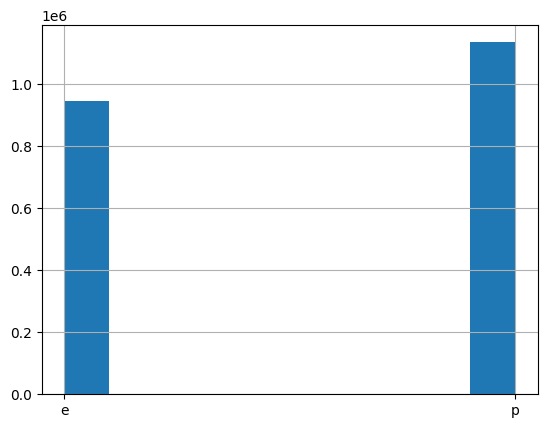

In [ ]:
df_sub['class'].hist()